# Командный проект по сегментации цитологических изображений

## Part №2

__Предыдущя часть - [segmentation_part_1](https://github.com/Koldim2001/Segmentation_cells-nuclei/blob/main/segmentation_part_1.ipynb)__

Если нет данных библиотек, то уберите # и загрузите

In [1]:
#pip install tensorflow
#pip install stardist
#pip install opencv-python
#pip install csbdeep

In [5]:
import pandas as pd
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
from PIL import Image
%matplotlib inline
%config InlineBackend.figure_formats = 'retina'
from tqdm import tqdm
from skimage.color import label2rgb
import zipfile
from skimage.color import rgb2gray
from scipy import ndimage
from sklearn.cluster import KMeans
from skimage.filters import sobel
import skimage.segmentation
import warnings
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
warnings.filterwarnings("ignore")

### Еще один способ сегментации по регионам

Давайте попробуем метод на основе области, используя преобразование водораздела. Сначала мы находим карту высот, используя градиент Собеля изображения.

Оператор Собеля выполняет двухмерное измерение пространственного градиента изображения и таким образом выделяет области с высокой пространственной частотой, соответствующие краям. Обычно он используется для нахождения приблизительной абсолютной величины градиента в каждой точке входного изображения в градациях серого. 

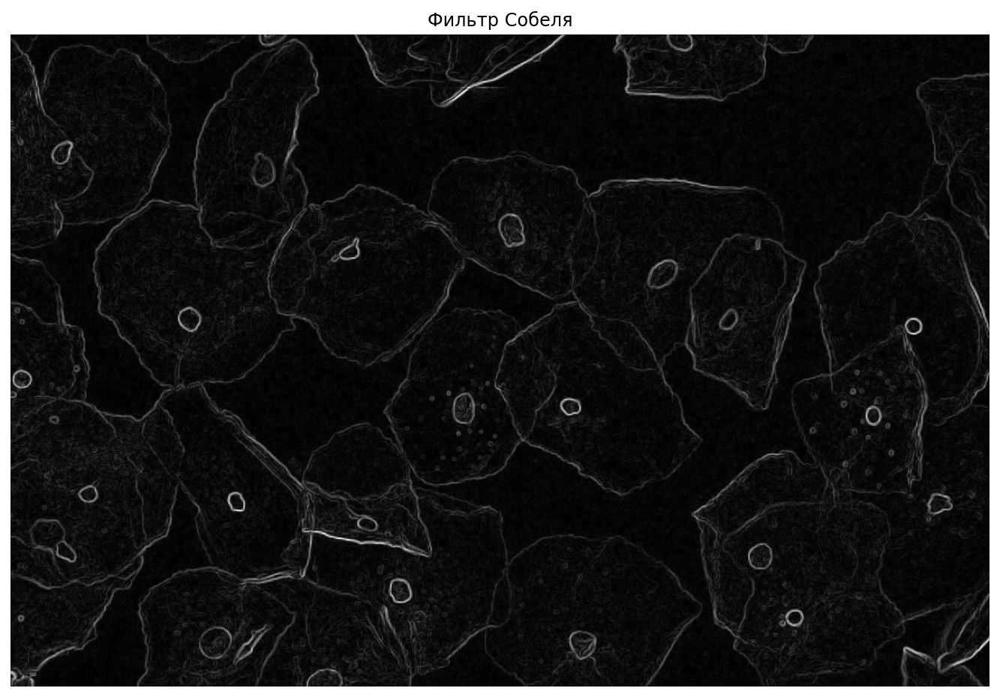

In [37]:
imm = gray
elevation_map = sobel(imm)
fig, ax = plt.subplots(figsize=(18,8))
ax.imshow(elevation_map, cmap='gray')
ax.axis('off')
ax.set_title('Фильтр Собеля')
plt.show()

Для водоращдела мы должны на вход задать маску предположительного расположения на гистограмме значений для клеток и для ядер. То есть задали примерный диапазон яркости по серому изображению

Сегментация ядер:

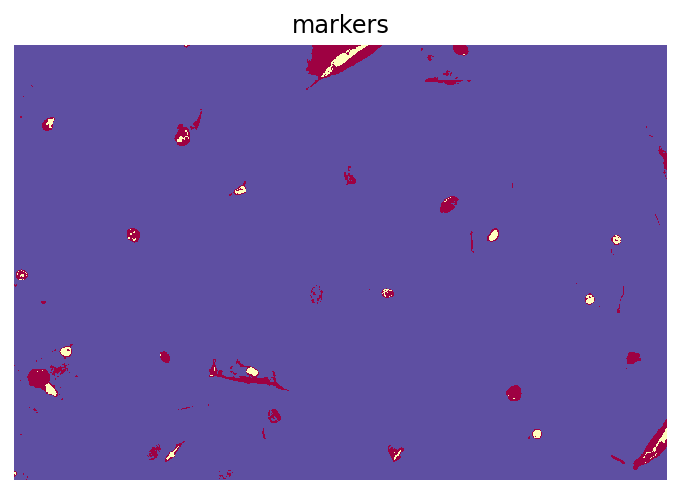

In [38]:
markers = np.zeros_like(imm)
markers[imm < 50] = 1
markers[imm >= 110] = 2

fig, ax = plt.subplots(figsize=(8,4))
ax.imshow(markers, cmap='Spectral', interpolation='nearest')
ax.axis('off')
ax.set_title('markers')
plt.show()

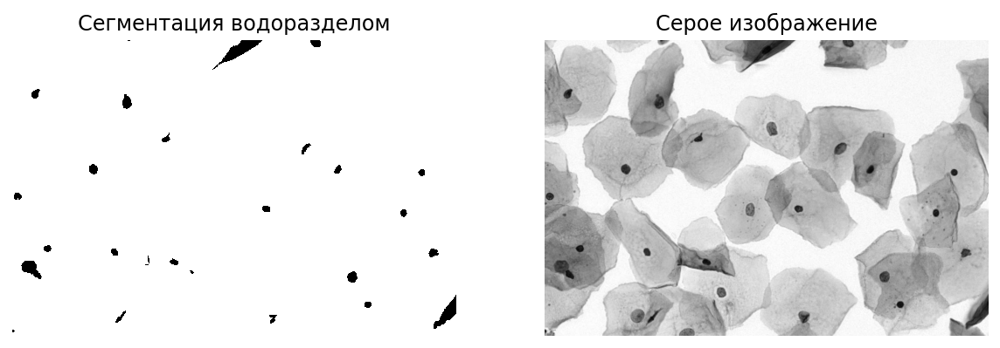

In [39]:
segmentation = skimage.segmentation.watershed(elevation_map, markers)
fig, ax = plt.subplots(figsize=(10,5))

plt.subplot(121)
plt.imshow(segmentation, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.title('Сегментация водоразделом')

plt.subplot(122)
plt.imshow(gray, cmap='gray')
plt.title('Серое изображение')
plt.axis('off')
plt.show()

Сегментация клеток:

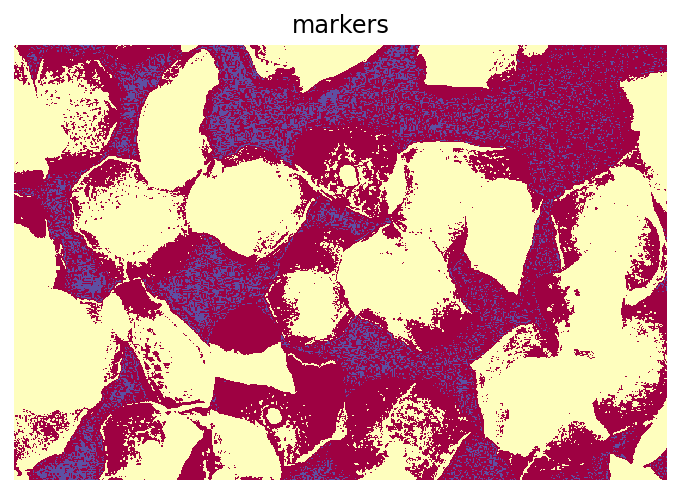

In [40]:
markers = np.zeros_like(imm)
markers[imm < 200] = 1
markers[imm >= 250] = 2

fig, ax = plt.subplots(figsize=(8,4))
ax.imshow(markers, cmap='Spectral', interpolation='nearest')
ax.axis('off')
ax.set_title('markers')
plt.show()

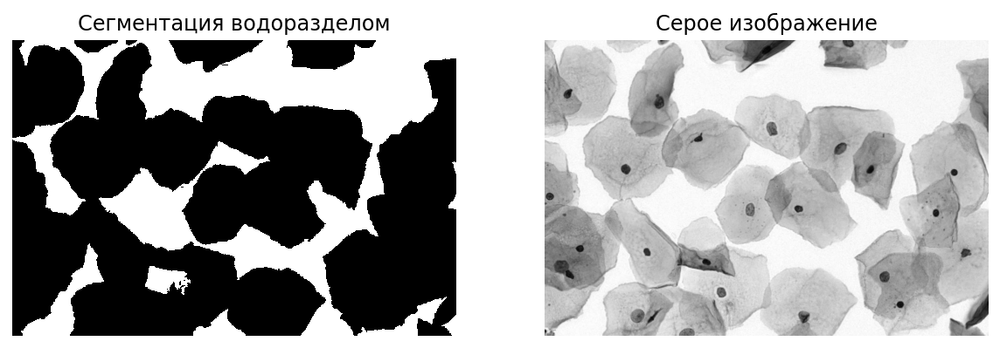

In [41]:
segmentation = skimage.segmentation.watershed(elevation_map, markers)
fig, ax = plt.subplots(figsize=(10,5))

plt.subplot(121)
plt.imshow(segmentation, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.title('Сегментация водоразделом')

plt.subplot(122)
plt.imshow(gray, cmap='gray')
plt.title('Серое изображение')
plt.axis('off')
plt.show()

Итоговая маска:

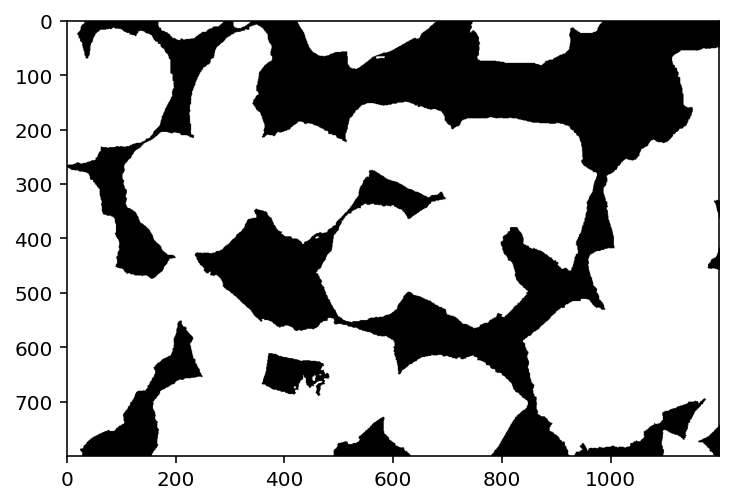

In [42]:
plt.imshow(abs(segmentation-2), cmap='gray')
plt.show()
segmentation_mask = abs(segmentation-2)

Оценка качесва проведенной сегментации клеток вороразделом

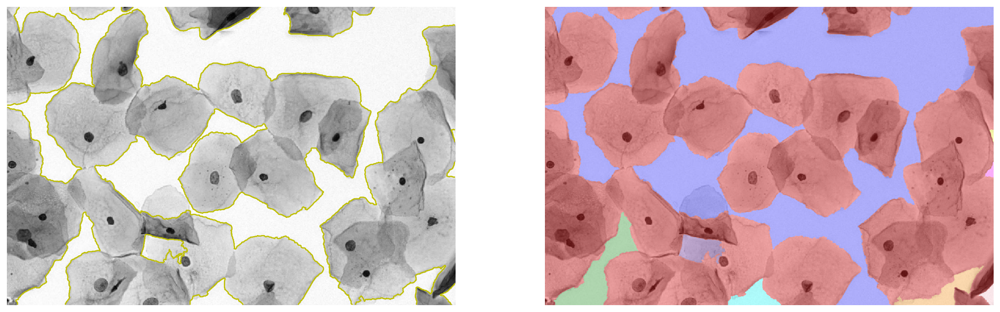

In [43]:
segmentation = ndimage.binary_fill_holes(segmentation - 1)
labeled_mountains, _ = ndimage.label(segmentation)
image_label_overlay = label2rgb(labeled_mountains, image=imm)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), sharex=True, sharey=True)
ax1.imshow(imm, cmap=plt.cm.gray, interpolation='nearest')
ax1.contour(segmentation, [0.5], linewidths=1.2, colors='y')
ax1.axis('off')
ax1.set_adjustable('box')
ax2.imshow(image_label_overlay, interpolation='nearest')
ax2.axis('off')
ax2.set_adjustable('box')

#### Обнаружение краев изображения: сегментация с использованием краевых методов
Использует прерывистые локальные особенности изображения для обнаружения краев и, следовательно, определения границы объекта.

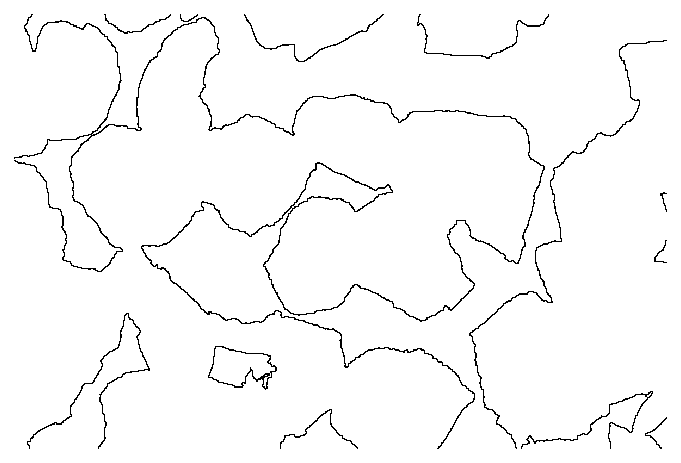

In [44]:
# мы собираемся использовать ядро лапласа здесь, чтобы обнаружить края в изображении 
kernel_laplace = np.array([np.array([1, 1, 1]), np.array([1, -8, 1]), np.array([1, 1, 1])])

out_l = ndimage.convolve(segmentation, kernel_laplace, mode='reflect')
arr=[]
for i in out_l.flatten():
    if i == 0:
        arr.append(0)
    else:
        arr.append(-100)
arr=np.array(arr)
arr=arr.reshape(out_l.shape[0],out_l.shape[1])
plt.imshow(arr,cmap='gray', interpolation='nearest')
plt.axis('off')
plt.show()

In [45]:
im=image/255
pic=im.reshape(im.shape[0]*im.shape[1],im.shape[2])

Сегментация с помошью метода машинного обучения кластеризации K-means: <br/>
при этом параметр числа кластеров будем сами задавать от 2 до 7.

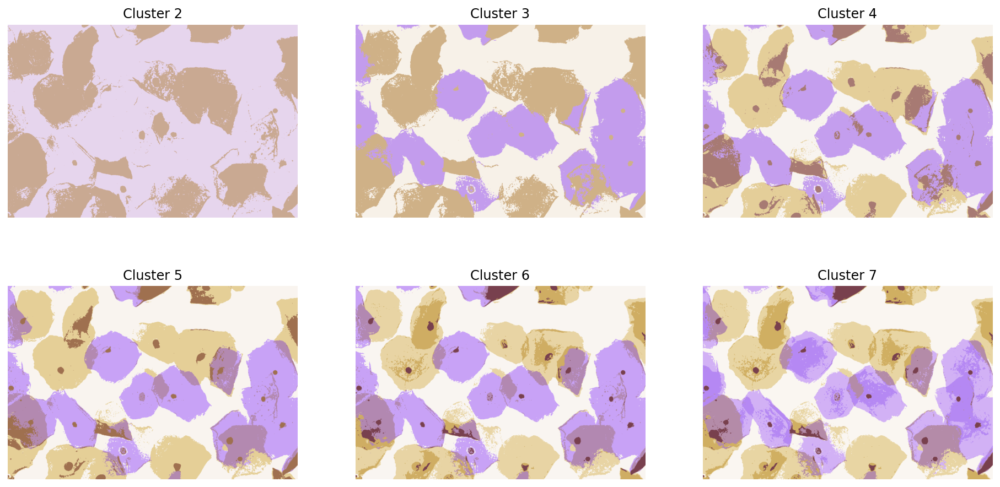

In [46]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8))
count=1
for i in range(2):
    for j in range(3):

        kmeans = KMeans(n_clusters=count+1, random_state=0).fit(pic)
        pic_print = kmeans.cluster_centers_[kmeans.labels_]
        clustered_pic=pic_print.reshape(im.shape[0],im.shape[1],im.shape[2])
        count+=1
        ax[i][j].set_title('Cluster '+str(count))
        ax[i][j].imshow(clustered_pic)
        ax[i][j].set_axis_off()
plt.show()

# Решение задачи instance сегментации клеток и ядер

## Реализация классическими методами:

#### Реализуем теперь метод водоразделов но будем искать разделы между соседними классами

Сегментация по водоразделу — один из самых популярных алгоритмов сегментации изображения, обычно используемый, когда мы хотим решить одну из самых сложных операций в обработке изображений — разделение похожих объектов на изображении, которые соприкасаются друг с другом.
По сути, мы разбиваем изображение на два разных набора:
1. водосборные бассейны — затемненные участки; Группа связанных пикселей с одинаковым локальным минимумом.
2. линии водораздела — линии, отделяющие одну зону водосбора от другой.
Водораздел широко используется для сегментации ячеек, но алгоритмы, основанные на водоразделе, имеют тенденцию к недостаточной сегментации, когда ячейки имеют большое перекрытие, или к чрезмерной сегментации, когда ячейки имеют разные формы и размеры.

In [47]:
img = cv2.imread("./Images/" + str(n) + ".png",1)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

Наш тест изображения — это ячейки, и наша цель — сегментировать эти ячейки. Заполним все отверстия, которые могут быть маленькими (площадь меньше 1000 пикселей).

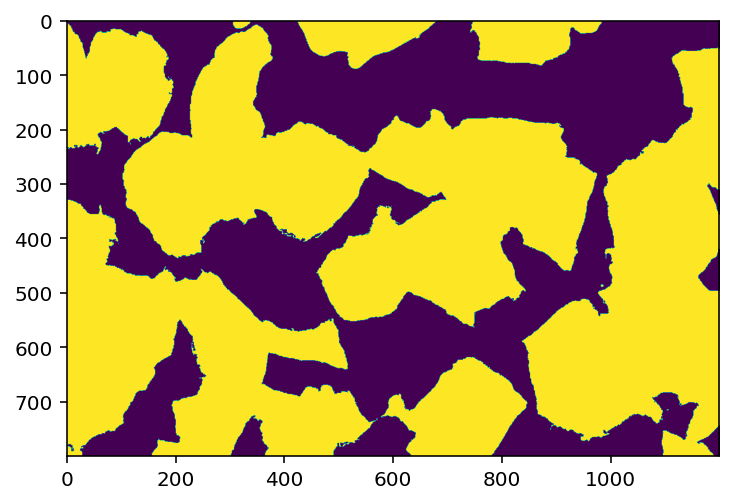

In [48]:
contornos, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
buracos = []
for con in contornos:
    area = cv2.contourArea(con)
    if area < 1000:
        buracos.append(con)
plt.imshow(cv2.drawContours(thresh, buracos, -1, 255, -1))
plt.show()

Теперь нам нужно попытаться разделить соприкасающиеся объекты и попытаться создать границу между ними. Одна идея состоит в том, чтобы создать границу как можно дальше от центров перекрывающихся объектов. Затем мы воспользуемся техникой, называемой преобразованием расстояния. Это оператор, который обычно принимает бинарные изображения в качестве входных данных, а интенсивность пикселей точек внутри областей переднего плана заменяется их расстоянием до ближайшего пикселя с нулевой интенсивностью (фоновый пиксель). Мы можем использовать функцию Distance_transform_edt() из библиотеки scipy. Эта функция вычисляет точное преобразование евклидова расстояния.

In [49]:
dist = ndimage.distance_transform_edt(thresh)
dist_visual = dist.copy()

Теперь нам нужно найти координаты пиков (локальных максимумов) белых областей на изображении. Для этого мы будем использовать функцию peak_local_max() из библиотеки Scikit-image. Мы применим эту функцию к нашему изображению Distance_transform, и на выходе мы получим маркеры, которые будут использоваться в функции водосбора.

In [50]:
local_max = peak_local_max(dist, indices=False, min_distance=20, labels=thresh)

Следующим шагом является маркировка маркеров для функции водосбора. Для этого воспользуемся функцией ndi.label() из библиотеки SciPy. Эта функция состоит из одного входного параметра, который представляет собой объект, подобный массиву, который нужно пометить. Любые ненулевые значения этого параметра считаются признаками, а нулевые значения считаются фоном. В нашем коде мы будем использовать координаты рассчитанного локального максимума. Затем функция ndi.label() случайным образом пометит все локальные максимумы разными положительными значениями, начиная с 1. Таким образом, если у нас есть 10 объектов на изображении, каждый из них будет помечен значением от 1 до 10.

In [51]:
markers = ndimage.label(local_max, structure=np.ones((3, 3)))[0]

Последний шаг — применить функцию skimage.segmentation.watershed() из библиотеки Scikit-image. В качестве параметров нам нужно передать наше инвертированное изображение преобразования расстояния и маркеры, которые мы вычислили в предыдущей строке кода. Поскольку алгоритм водораздела предполагает, что наши маркеры представляют собой локальные минимумы, нам нужно инвертировать наше изображение преобразования расстояния. Таким образом, светлые пиксели будут представлять большие возвышения, а темные пиксели будут представлять низкие возвышения для преобразования водораздела.

In [52]:
labels = watershed(-dist, markers, mask=thresh)

И, наконец, мы построим наше исходное изображение, бинарное изображение, изображение с преобразованием расстояния и изображение водораздела.

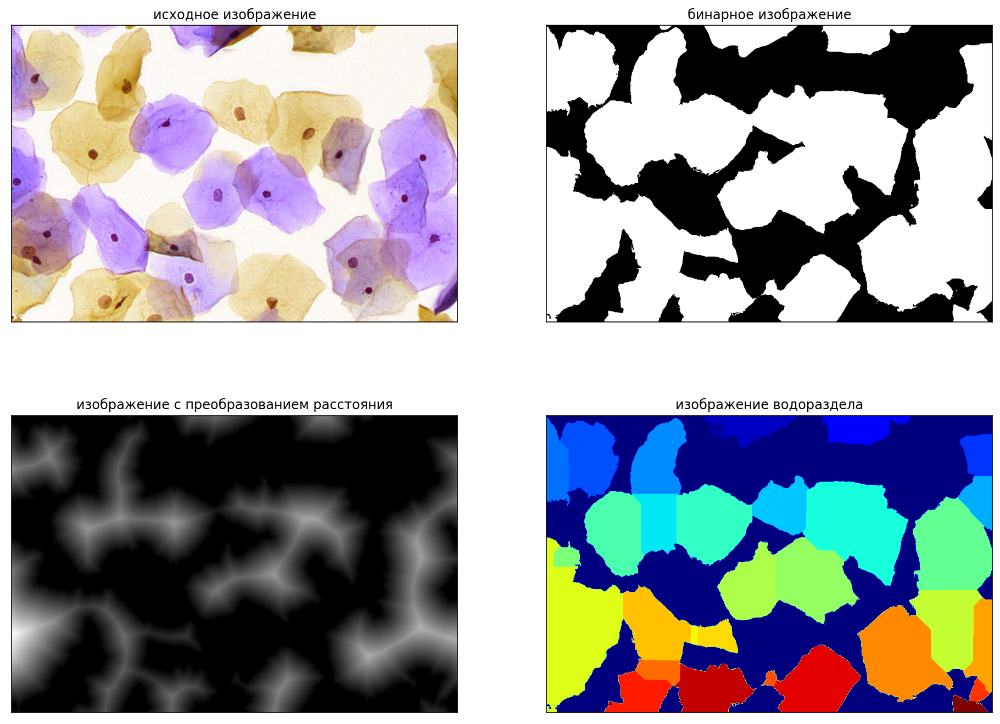

In [53]:
titulos = ['исходное изображение', 'бинарное изображение', 'изображение с преобразованием расстояния', 'изображение водораздела']
imagens = [img, thresh, dist_visual, labels]
fig = plt.gcf()
fig.set_size_inches(16, 12)  
for i in range(4):
    plt.subplot(2,2,i+1)
    if (i == 3):
        cmap = "jet"
    else:
        cmap = "gray"
    plt.imshow(imagens[i], cmap)
    plt.title(titulos[i]) 
    plt.xticks([]),plt.yticks([])     
plt.show()

## Реализация с помощью глубокого машинного обучения

Автоматическое обнаружение и сегментация клеток и ядер на
микроскопических изображениях важны для многих биологических приложений. Недавние
успешные подходы, основанные на обучении, включают сегментацию ячеек по пикселям
с последующей группировкой пикселей или локализацию ограничивающих рамок с
последующим уточнением формы. В ситуациях переполненных ячеек они могут
быть подвержены ошибкам сегментации, таким как ложное объединение граничащих ячеек
или подавление допустимых экземпляров ячеек из-за плохой аппроксимации с
помощью ограничивающих рамок. Чтобы преодолеть эти проблемы, нейронная автоэнкодерная сверточная сеть STARDIST позволяет локализовать ячейку
ядра с помощью звездообразно-выпуклых многоугольников, которые представляют собой гораздо лучшее представление формы по сравнению с ограничивающими рамками и, следовательно, не нуждаются
в уточнении формы. С этой целью мы обучим сверточную нейронную сеть, которая
предскажет для каждого пикселя отнесенность к той или иной клетке/ядру

**В данном ноутбуке рассмотрим лишь то, как в результате нейронная сеть сегментирует ядра и клетки. Процесс самого обучения рассмторен в ноутбуке training.ipynb**

У нас имеется несколько отдельных папок в репозитории, доступном по ссылке в README. В них лежат маски и сами изображения, на которых производилось обучение. При этом из-за маленькиого числа фоток в train мы использовали аугментацию (то есть вращали исходные фотки и маски на 90, 180 и 270 градусов)

### Нейронная сеть для сегментации клеток:

Архив SD_models_400.zip содержит весовые коэффициенты, полученные в результате обучения нейронной сети StarDist со следующими параметрами:

Количество эпох обучения: 400
Количество лучей из центра клетки к краям: 32
Размер окна зрения нейронной сети: (4, 4) (данный размер выбран исходя из размерности изображений для обучения 512х512 пикселей, он больше рекомендованного в 2 раза, что потенциально снижает точность, в последствии можно попробовать сжать исходные изображения и их маски до меньшего размера и использовать окно зрения (2, 2)
Распакуем данный архив для получения необходимых файлов

In [6]:
# Unzip the dataset (if we haven't already)
if not os.path.exists('./models_1/'):
    with zipfile.ZipFile('SD_models_400.zip', 'r') as models_1:
        models_1.extractall('.')

Подключим нужные библиотеки:

In [67]:
from stardist import random_label_cmap, _draw_polygons
from stardist.models import StarDist2D
import random
import colorsys
import matplotlib
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams["image.interpolation"] = None
lbl_cmap = random_label_cmap()
from skimage.io import imread, imshow
from csbdeep.utils import normalize
import statistics
import seaborn as sns
import numpy.linalg as la
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
np.random.seed(6)

In [68]:
def random_colors(N, bright=True):

    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

In [69]:
model = StarDist2D(None, name='stardist', basedir='models_1')

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.569467, nms_thresh=0.5.


Возьмем для оценки тестовое изображеие 09, на котором нейронки не обучались и предскажем его:

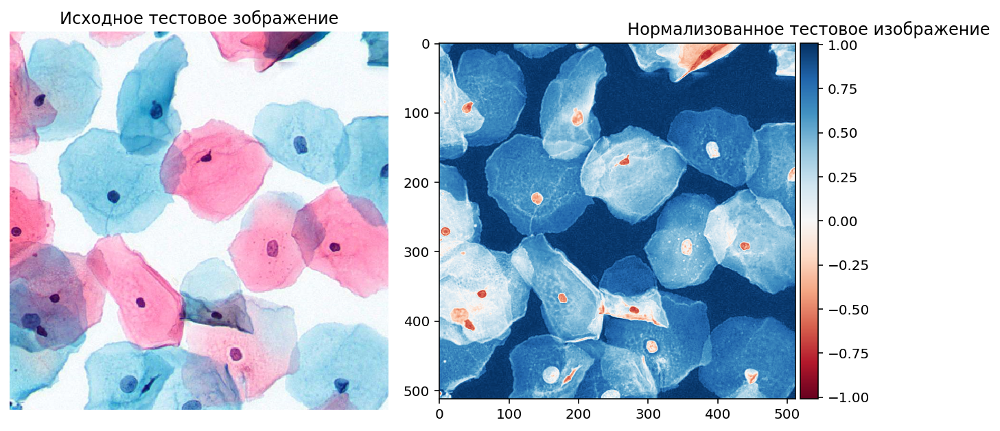

In [70]:
fig, ax = plt.subplots(figsize=(9,15))

plt.subplot(121)
test_im = np.array(Image.open("./Images/" + str('09') + ".png"))
test_im = test_im[0:800,0:800]
test_im = Image.fromarray(test_im)
# downsize the image with an ANTIALIAS filter (gives the highest quality)
test_im = test_im.resize((512,512),Image.ANTIALIAS)
test_im = np.array(test_im)
plt.imshow(test_im)
plt.axis('off')
plt.title('Исходное тестовое зображение')

plt.subplot(122)
orig_img = test_im.copy()
test_im = cv2.cvtColor(test_im, cv2.COLOR_BGR2GRAY)
test_im = normalize(test_im)
imshow(test_im)
plt.title('Нормализованное тестовое изображение')
img = test_im.copy()
plt.show()

In [71]:
labels, details = model.predict_instances(test_im, return_predict=False)

1/1 [==============================] - 2s 2s/step


Рассмотрим внешний вид масок:

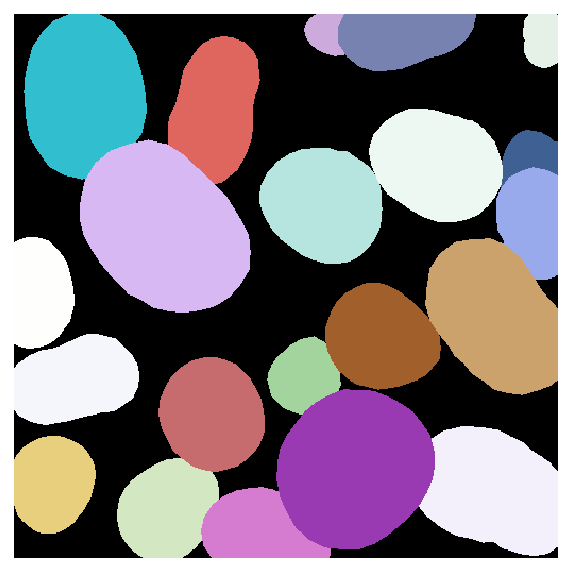

In [72]:
plt.figure(figsize=(5, 5))
plt.imshow(labels, cmap=lbl_cmap)
plt.axis('off');

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
0,0,0,0,0,0,0,0,21,21,21,...,21,21,21,21,21,21,21,21,21,21
1,0,0,0,0,0,0,21,21,21,21,...,21,21,21,21,21,21,21,21,21,21
2,0,0,0,0,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,21,8
3,0,0,0,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,21,8
4,0,0,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,8,8
5,0,0,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,8,8
6,0,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,8,8,8
7,21,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,8,8,8
8,21,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,8,8,8,8


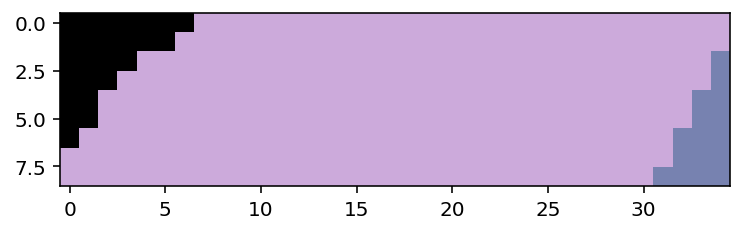

In [73]:
plt.imshow(labels[1:10,275:310], cmap=lbl_cmap)
df = pd.DataFrame(data=labels[1:10,275:310])
df

Как видно: фон - 0, а каждая клетка получет свой уникальный идентификатор (номер от 1 до числа клкток на фото)

In [74]:
my_fl_labels, my_fl_details = model.predict_instances(normalize(img))

1/1 [==============================] - 0s 82ms/step


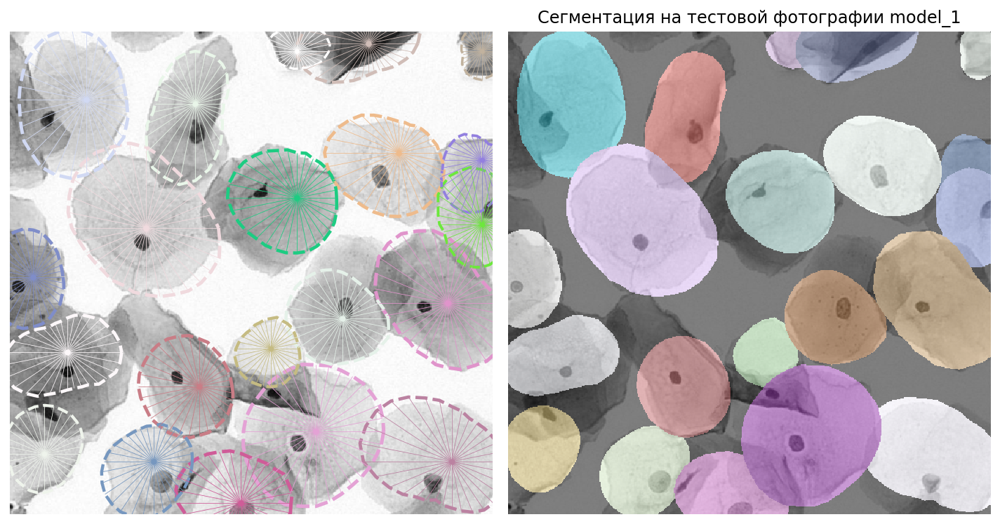

In [75]:
lbl_cmap = random_label_cmap()

plt.figure(figsize=(10,10))
img_show = img if img.ndim==2 else img[...,0]
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']
plt.subplot(121); 
plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)
plt.subplot(122); 
plt.imshow(img_show, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.5)
plt.title('Сегментация на тестовой фотографии model_1')
plt.tight_layout()
plt.show()

Ради интереса посмотрим какой результат сегментации на фотке из трейновой выборки

(512, 512)
1/1 [==============================] - 0s 81ms/step


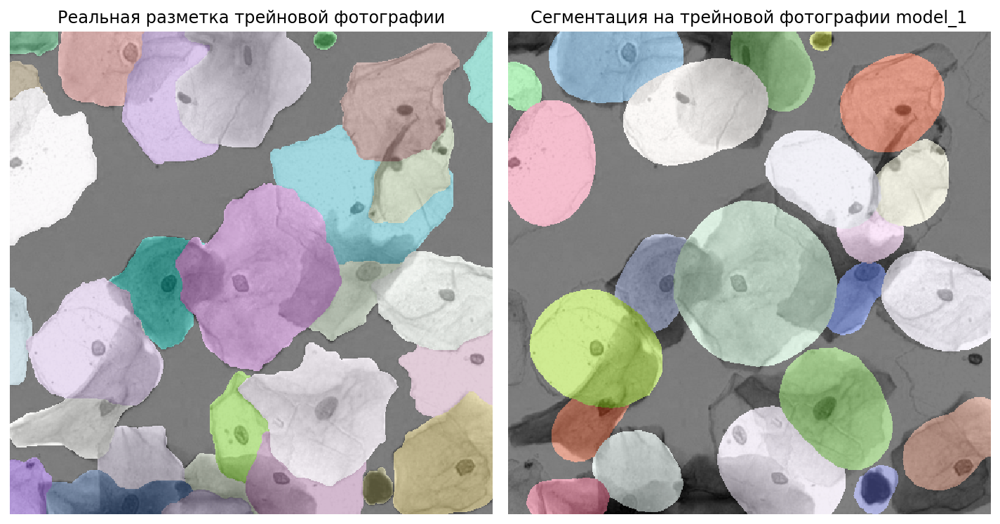

In [76]:
tr = np.array(Image.open("./images_train_cells/" + str('01') + ".tif.tif"))
print(tr.shape)
my_fl_labels, my_fl_details = model.predict_instances(normalize(tr))
lbl_cmap = random_label_cmap()
img = tr

plt.figure(figsize=(10,10))

plt.subplot(121);
m_tr = np.array(Image.open("./Masks_train_cells/" + str('01') + ".tif.tif"))
plt.imshow(img, cmap='gray'); plt.axis('off')
plt.imshow(m_tr, cmap=lbl_cmap, alpha=0.5)
plt.title('Реальная разметка трейновой фотографии')
plt.tight_layout()

plt.subplot(122); 
plt.imshow(img, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.5)
plt.title('Сегментация на трейновой фотографии model_1')
plt.tight_layout()

plt.show()

Архив SD_models_800.zip содержит весовые коэффициенты, полученные в результате обучения нейронной сети StarDist со следующими параметрами:

Количество эпох обучения: 800
Количество лучей из центра клетки к краям: 32
Размер окна зрения нейронной сети: (4, 4) (данный размер выбран исходя из размерности изображений для обучения 512х512 пикселей, он больше рекомендованного в 2 раза, что потенциально снижает точность, в последствии можно попробовать сжать исходные изображения и их маски до меньшего размера и использовать окно зрения (2, 2)
Распакуем данный архив для получения необходимых файлов

In [78]:
# Unzip the dataset (if we haven't already)
if not os.path.exists('./models_2/'):
    with zipfile.ZipFile('SD_models_800.zip', 'r') as models_2:
        models_2.extractall('.')

In [79]:
model = StarDist2D(None, name='stardist_2', basedir='models_2')

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.517099, nms_thresh=0.3.


In [80]:
my_fl_labels, my_fl_details = model.predict_instances(normalize(img))

1/1 [==============================] - 0s 230ms/step


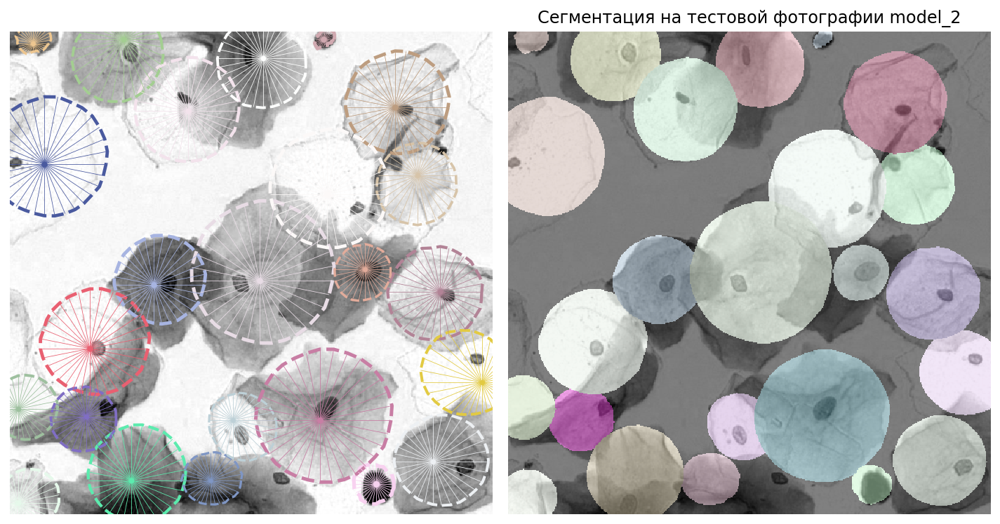

In [81]:
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(10,10))
img_show = img if img.ndim==2 else img[...,0]
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']
plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)
plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.5)
plt.title('Сегментация на тестовой фотографии model_2')
plt.tight_layout()
plt.show()


Ради интереса посмотрим какой результат сегментации на фотке из трейновой выборки

(512, 512)
1/1 [==============================] - 0s 88ms/step


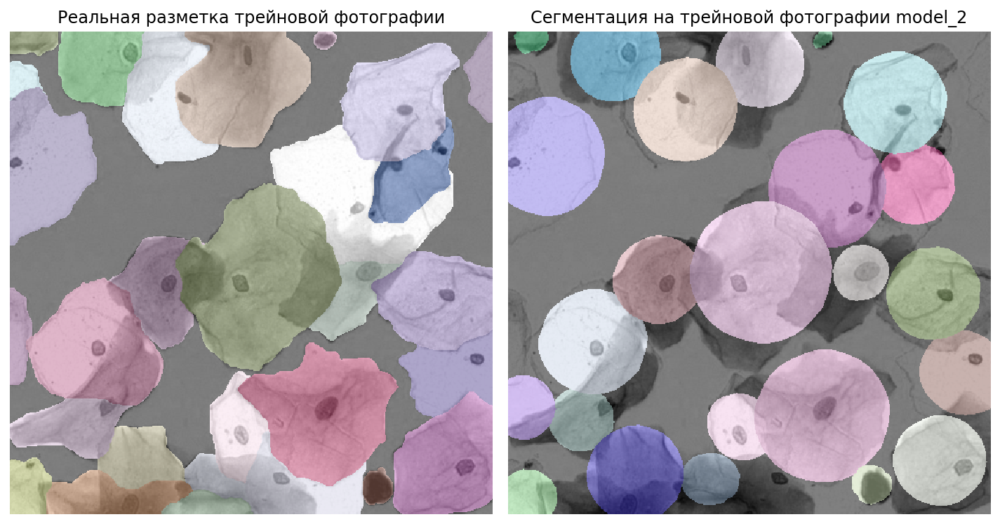

In [82]:
tr = np.array(Image.open("./images_train_cells/" + str('01') + ".tif.tif"))
print(tr.shape)
my_fl_labels, my_fl_details = model.predict_instances(normalize(tr))
lbl_cmap = random_label_cmap()
img = tr

plt.figure(figsize=(10,10))

plt.subplot(121);
m_tr = np.array(Image.open("./Masks_train_cells/" + str('01') + ".tif.tif"))
plt.imshow(img, cmap='gray'); plt.axis('off')
plt.imshow(m_tr, cmap=lbl_cmap, alpha=0.5)
plt.title('Реальная разметка трейновой фотографии')
plt.tight_layout()

plt.subplot(122); 
plt.imshow(img, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.5)
plt.title('Сегментация на трейновой фотографии model_2')
plt.tight_layout()

plt.show()

Таким образом, мы оперделили, что сегментация с помощью модели с большим числом эпох (800) хуже, чем там где эпох 400. Это может говорить о переобчении и о том, что маски клеток при увеличении длительности обучения все больше и больше стремятся к округлым формам, что слабо соотносится с ральной формой плоских клеток

### Нейронная сеть для сегментации ядер:

Архив *models_nuclei.zip* содержит весовые коэффициенты, полученные в результате обучения нейронной сети StarDist на предсказание ЯДЕР КЛЕТОК со следующими параметрами: 
1. Количество эпох обучения: 400
2. Количество лучей из центра клетки к краям: 32
3. Размер окна зрения нейронной сети: (2, 2) 
Распакуем данный архив для получения необходимых файлов

In [85]:
# Unzip the dataset (if we haven't already)
if not os.path.exists('./models/'):
    with zipfile.ZipFile('SD_models_nuclei.zip', 'r') as models:
        models.extractall('.')

In [86]:
model = StarDist2D(None, name='stardist', basedir='models')

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.481503, nms_thresh=0.3.


1/1 [==============================] - 0s 253ms/step


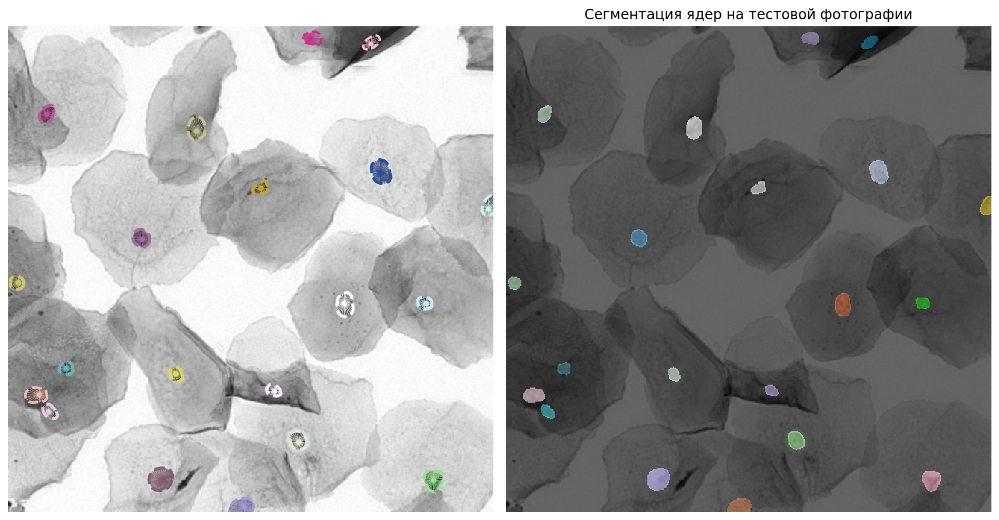

In [87]:
img = test_im.copy()
my_fl_labels, my_fl_details = model.predict_instances(normalize(img))
lbl_cmap = random_label_cmap()

plt.figure(figsize=(12,12))
img_show = img if img.ndim==2 else img[...,0]
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']

plt.subplot(121);
plt.imshow(img_show, cmap='gray');
plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)

plt.subplot(122);
plt.imshow(img_show, cmap='gray');
plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.6)
plt.title('Сегментация ядер на тестовой фотографии')
plt.tight_layout()
plt.show()

С задачей сегментации клеток нейронка справилась преавосходно!

__Вывод:__

При использовании Stardist для задачи сегментации клеток мы столкнулись с проблемами, из-за которых результат оставляет желать лучшего. <br/>Причиной этого является то, что сеть statdist очень плохо способна обрабатывать пересекающиеся объекты, а в нашем случае все клетки пересекались друг с другом, что не давало сети увидеть закономерности. Так же ключевой задачей данной сети является поиск и детекция объектов стар-конвексной формы (то есть схожих с эллипсами), а из-за частого пересечения двухмерные маски клеок, подававшиеся на обучения к соответсвующим фотографиям,совсем не обладали такой требуемой формой, что усожняло процесс обучения сети.<br/>
Именно по этой причине как раз результаты сегментации ядер очень хороши, ведь ядра не пересекались друг с другом и имели четкую старконвексную форму, подходящую под задачу stardist.

В дальнейшем планируется решить задачу по улучшению качесва работы инстанс сегментации клеток. Для этого как вариант - это попробовать использовать сеть Mask-RCNN, которая не привязывается к конкретной старконвексной форме детектируемых объектов. <br/> Также планируется решить как использовать трехмерную результирующую маску (то есть сделать что-то подобии послойного представления, которое будет говорить какая клетка лежит за какой, что сделает в каждом слое маски очевиную старконвексную форму для каждой клетки плоского эпителия матки. Тем самым выходная маска будет многоканальной) <br/>
Так же планируется проведение исследований с теми же сетями, но в следующий раз на вход обучения и теста будем подавать многоканальное изображение RGB или HSV (в этот раз входная фотка - ч/б представление). Так как клетки особено по цветам друг от друга отличаютя, что способствует более интуитивному определению форм. Так что многоканальность входного изображения должна повысить точность итоговой инстанс-сегментации

Для проведения семантической сегментации использование классических методов пороговой сегментации в разных цветовых отображениях типа RGB и HSV вполне достаточно для качественного бинарного сегментирования области клеток и областей ядер на остальном фоне. Так что использование сложных сегментирующих сетей с архитектурой типа «песочные часы» на подобии U-Net не требуется.

*см далее: [training.ipynb](https://github.com/Koldim2001/Segmentation_cells-nuclei/blob/main/training.ipynb) (код по обучению нейронной сети)*